# Python 101- Pygmt 繪圖
###### Jing-Hui Tong 2022/06/17
###### Coutesy of IRIS ROSES unit05 on 2021/07/20 from Liam Toney, Geophysical Institute, University of Alaska Fairbanks
###### Coutesy of 2019 NTNU Summer Program from Chih-Ming Lin, Dep. of Earth Science, NTNU

In [1]:
import pygmt
import pandas as pd

### The `config` argument: Change GMT defaults globall

detail please see: https://docs.generic-mapping-tools.org/latest/gmt.conf.html

* **length unit**

  c: cm

  i: inch(2.54 cm)

  p: point(1/72 of an inch)

In [2]:
pygmt.config(FONT_ANNOT_PRIMARY = '10p,Times-Roman',
            FONT_LABEL = '8',
            MAP_LABEL_OFFSET = '4p',
            MAP_TICK_LENGTH_PRIMARY = '5p',
            PROJ_LENGTH_UNIT = 'c',
            MAP_ANNOT_OFFSET_PRIMARY = '5p',
            MAP_ANNOT_OFFSET_SECONDARY = '5p',
            MAP_FRAME_TYPE = 'fancy',
            MAP_FRAME_WIDTH = 'auto',
            FORMAT_GEO_MAP = 'D',
            PS_CHAR_ENCODING = 'Standard+',
            MAP_FRAME_PEN = '2p,black')

In PyGMT, every plot or map must start with the creation of a [`pygmt.Figure`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.html#pygmt.Figure)

In [3]:
fig = pygmt.Figure()

#### Your first pygmt figure! 

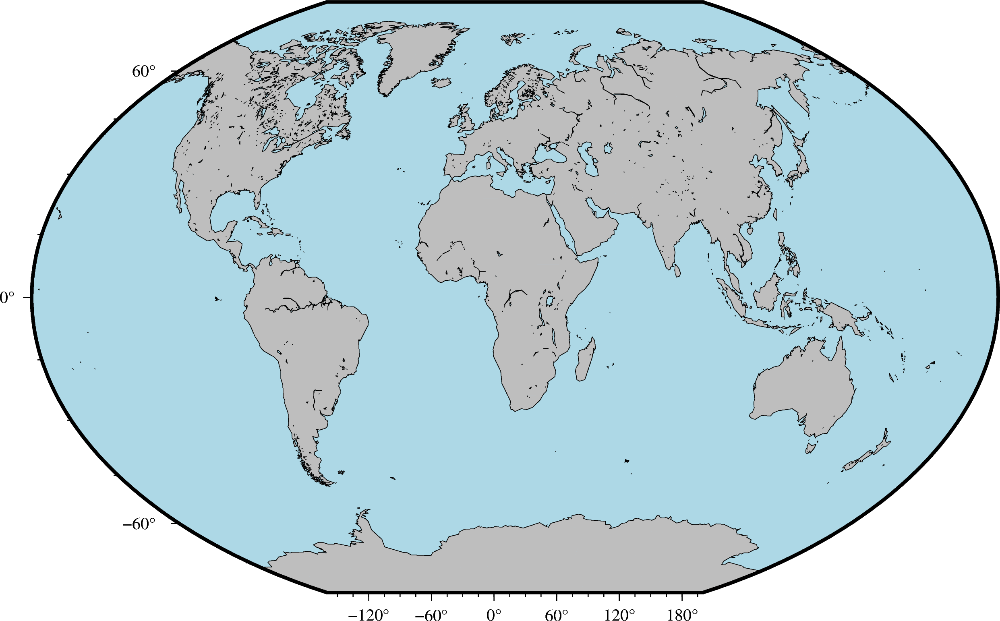

In [4]:
fig.coast(
    region='g',
    projection='R20/8i',
    shorelines=True,
    water='lightblue',
    land='grey',
    frame=True)

fig.show()

### `Figure.coast()`
[`fig.coast()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.coast.html) Plot continents, shorelines, rivers, and borders on maps

* **shorelines**: [level/]pen ->  level is 1-4 and represent coastline, lakeshore, island-in-lake shore, and lake-in-island-in-lake shore

     pen attributes [Default is width = default, color = black, style = solid]
* **water**: Select filling or clipping of “wet” areas.
* **land**: Select filling or clipping of “dry” areas.
* **frame**: Set map boundary [detail info.](https://www.pygmt.org/latest/tutorials/basics/frames.html)
* **resolution**: **f**|**h**|**i**|**l**|**c** -> (f)ull, (h)igh, (i)ntermediate, (l)ow, and (c)rude.

### The `region` argument

  The `region` argument controls the geographic or Cartesian extent of the figure. (In PyGMT parlance, we call `region` an "alias" for `R`.) In PyGMT, regions are specified as lists of `[xmin, xmax, ymin, ymax]`, e.g. `region=[45, 55, 135, 145]`. I used another shortcut, `region='g'`, which specifies a **global** domain.
  
### The  `projection` argument

  The `projection` argument controls the map projection. GMT (and therefore PyGMT) supports 31 different map projections, from basic Cartesian axes to [arbitrary vertical perspectives](https://docs.generic-mapping-tools.org/latest/gallery/ex26.html). Again, if you're familiar with GMT, these are specified using the `-J` flag, as in `-JM4i`. In PyGMT, projections codes are still strings, but the `J` is dropped, so an equivalent PyGMT argument would be `projection='M4i'`.
  
  -> different projection method:
  https://www.pygmt.org/latest/projections/index.html



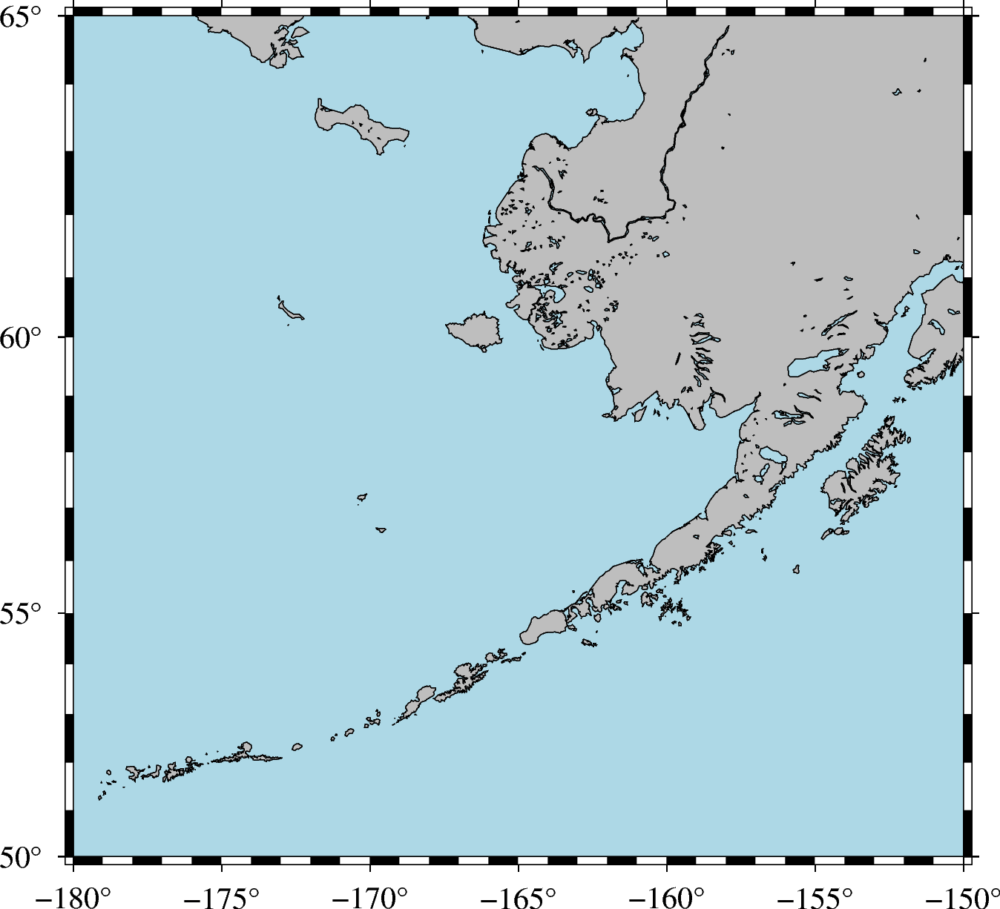

In [5]:
fig = pygmt.Figure()
fig.coast(
    region=[-180, -150, 50, 65],
    projection='M4i',
    shorelines=1,  
    water='lightblue', 
    land='grey', 
    frame=['WSne','a5f1']) # axis, frame
fig.show()

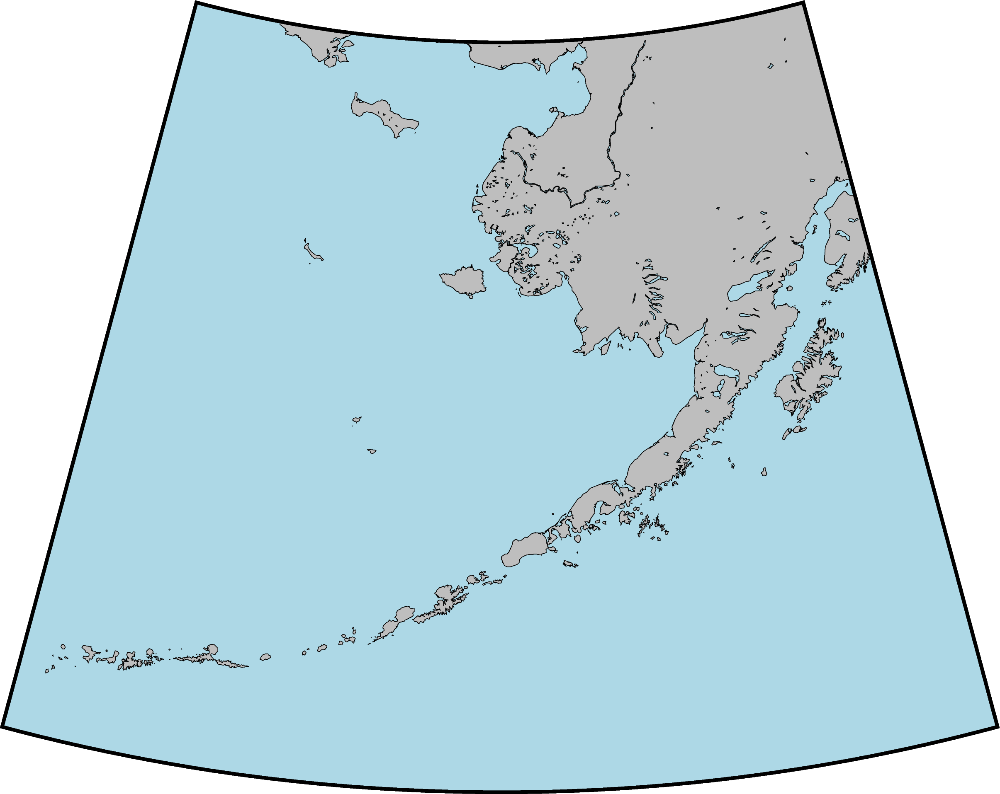

In [6]:
fig = pygmt.Figure()
fig.coast(
    region=[-180, -150, 50, 65],
    projection='S-165/90/8i', 
    shorelines=True,
    water='lightblue',
    land='grey',
    frame=0,
    resolution='i', 
)
fig.show()

### `pygmt.grdcut()`
[`pygmt.grdcut()`](https://www.pygmt.org/latest/api/generated/pygmt.grdcut.html) "Produce a new outgrid" file which is a subregion of grid.

* **grid**: The file name of the input grid
##### The available datasets: "@" [global relief data and NASA satellite imagery](https://www.generic-mapping-tools.org/remote-datasets/)
1° (deg)= 60' (min)= 3600“ (sec)
* **region**: [xmin/xmax/ymin/ymax]; Specify the region of interest.

In [8]:
pygmt.grdcut(grid='@earth_relief_30s', 
             outgrid='Alaska.grd', 
             region=[-180, -150, 50, 65])

In [9]:
print(pygmt.grdinfo(grid='Alaska.grd'))

Alaska.grd: Title: Produced by grdcut
Alaska.grd: Command: grdcut @earth_relief_30s_p/ -GAlaska.grd -R-180/-150/50/65
Alaska.grd: Remark: 
Alaska.grd: Pixel node registration used [Geographic grid]
Alaska.grd: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7
Alaska.grd: x_min: -180 x_max: -150 x_inc: 0.00833333333333 (30 sec) name: longitude n_columns: 3600
Alaska.grd: y_min: 50 y_max: 65 y_inc: 0.00833333333333 (30 sec) name: latitude n_rows: 1800
Alaska.grd: v_min: -7977.5 v_max: 6090.5 name: z
Alaska.grd: scale_factor: 1 add_offset: 0
Alaska.grd: format: netCDF-4 chunk_size: 129,129 shuffle: on deflation_level: 3



### `pygmt.makecpt()`
Make GMT color palette tables.
* **cmap**: types https://docs.generic-mapping-tools.org/latest/cookbook/cpts.html
* **series**: [ min/max ]  Defines the range of the new CPT 
* **continuous**: True/False (default=False, namely "discrete")


In [7]:
pygmt.makecpt(cmap="geo", 
              series=[-8000, 7000, 500], 
              output = 'eleva.cpt',
              continuous=True)

### `Figure.grdimage()`

[`Figure.grdimage()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.grdimage.html#pygmt.Figure.grdimage) Project and plot grids or images

* **grid**: The file name of the input grid
##### The available datasets: "@" [global relief data and NASA satellite imagery](https://www.generic-mapping-tools.org/remote-datasets/)
* **cmap**: File name of a CPT file 
* **transparency**: Set transparency level, in [0-100] percent range. Default is 0

### `Figure.coast()`
* **map_scale**: **g**|**j**|**J**|**n**|**x** refpoint+wlength. Draws a simple map scale centered on the reference point specified.

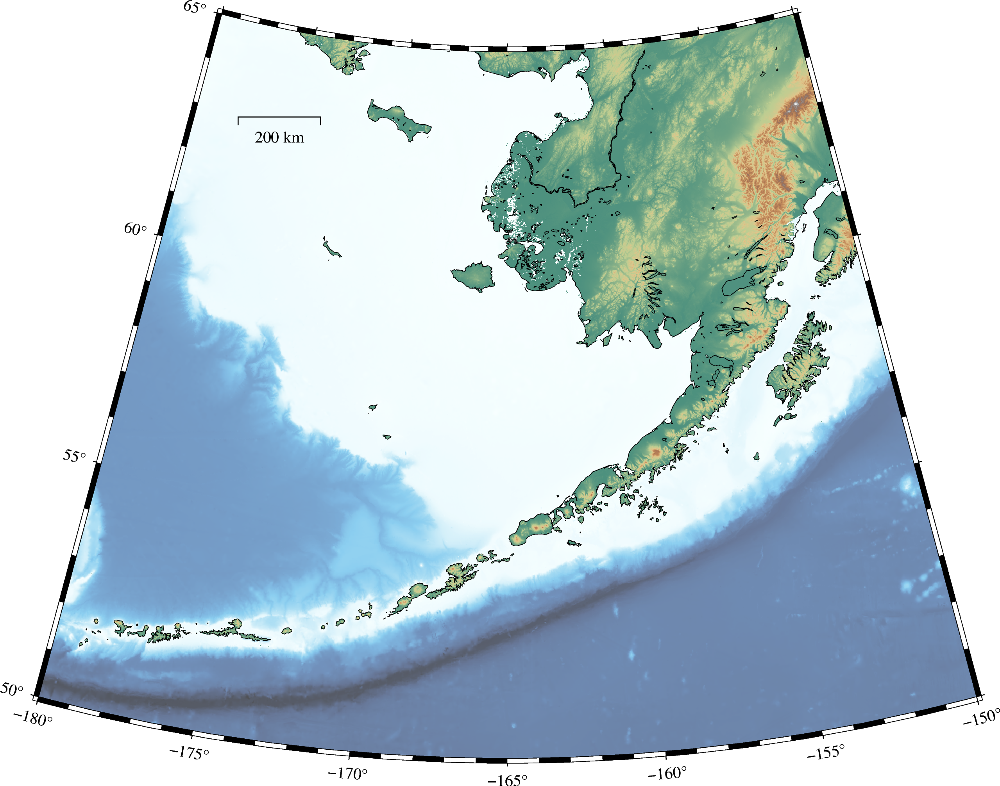

In [9]:
grid = 'Alaska.grd'
fig = pygmt.Figure()
fig.grdimage(grid=grid,
             projection='S-165/90/8i',
             cmap="eleva.cpt", 
             transparency=30)

fig.coast(projection='S-165/90/8i', 
    shorelines=True,
    frame=True,
    resolution='i',
    map_scale='g-176/63+w200k+u')

fig.show()

### `Figure.grdcontour()`

[`Figure.grdcontour()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.grdcontour.html) Convert grids or images to contours and plot them on maps.

* **grid**: The file name of the input grid
* **annotation**: str/int/float -> Specify or disable annotated contour levels
* **interval**: Specify the contour lines to generate.
* **limit**: [low/high] ->ONLY draw contours between the range
* **pen**: linewidth,color -> Set pen attributes for lines

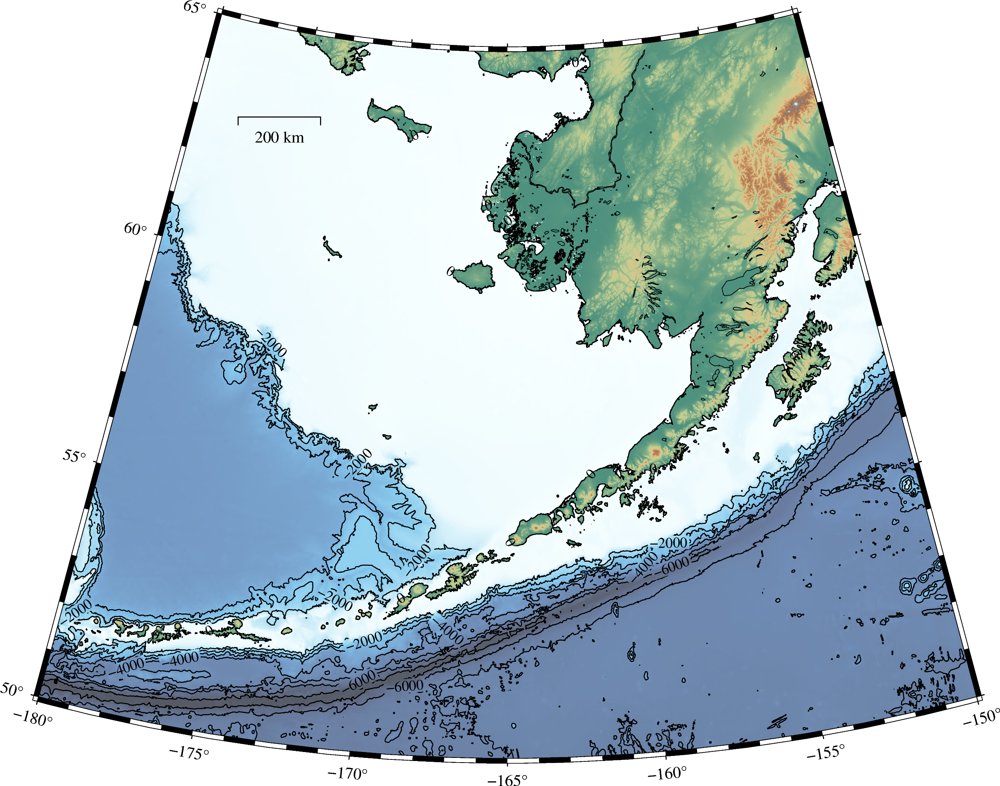

In [11]:
fig.grdcontour(grid=grid,
               annotation=2000,
               interval=1000,
               limit=[-8000, 0],
              pen='0.5p,black')


fig.show()

### `Figure.colorbar()`

[`Figure.colorbar()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.colorbar.html) Plot a gray or color scale-bar on maps.

* **cmap**: File name of a CPT file
* **position**:  
    **x** for plot coordinates: x/y  
    **+w** for length and width of the color bar  
    **+m** for colorbar title position  
    **+h** horizontal colorbar, if you want to plot vertical one, use **+v**
* **frame**: Set color bar boundary frame, labels, and axes attributes

##### especially for **+m**:
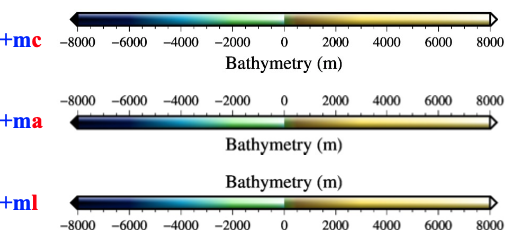

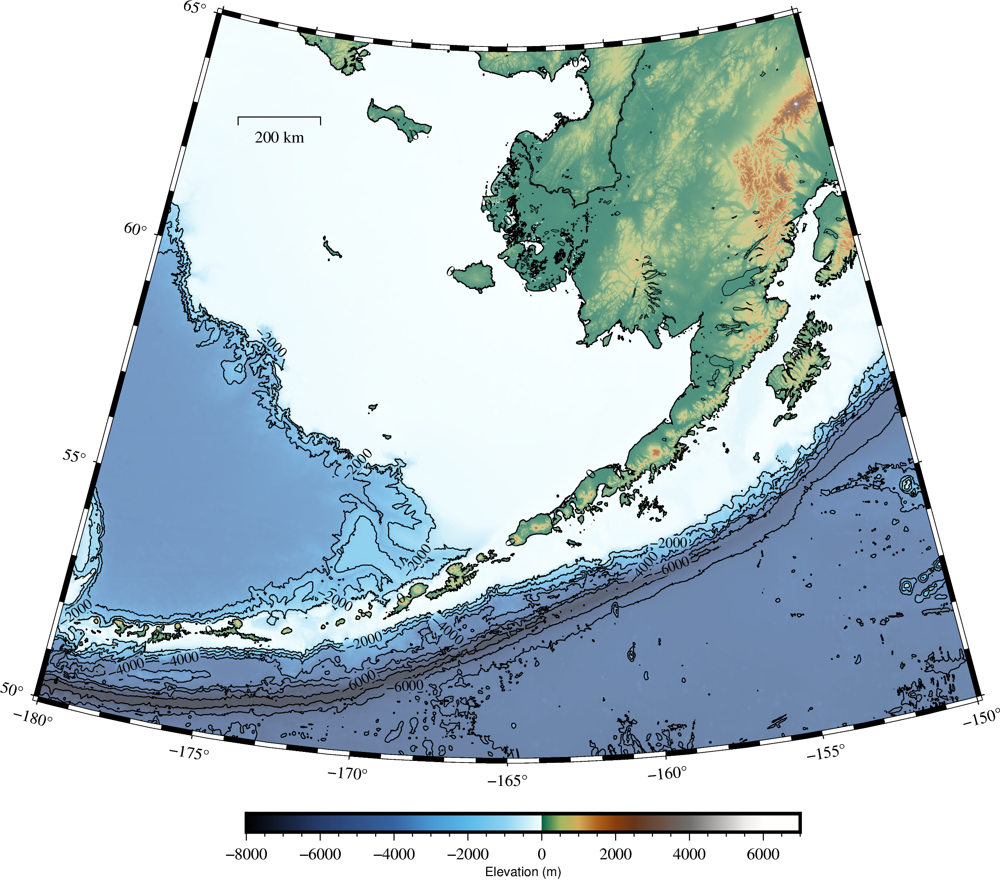

In [12]:
fig.colorbar(cmap = 'eleva.cpt', 
             position = 'x4.5/-1.6+w12c/0.4c+mc+h', 
             frame = 'a2000f500+l"Elevation (m)"') 

fig.show()

## Adding more 

In [13]:
df = pd.read_csv('AK_station_info.csv')

### `Figure.plot()`

[`Figure.plot()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.plot.html) Plot lines, polygons, and symbols in 2-D.

> **Must provide either data or x/y**

* **style**: [Plot symbols](https://www.pygmt.org/latest/gallery/symbols/basic_symbols.html#sphx-glr-gallery-symbols-basic-symbols-py)
* **color**: Select color for filling of symbols, for more color-->[list color](https://docs.generic-mapping-tools.org/6.2/gmtcolors.html)
* **pen**: Set pen attributes for lines or the outline of symbols

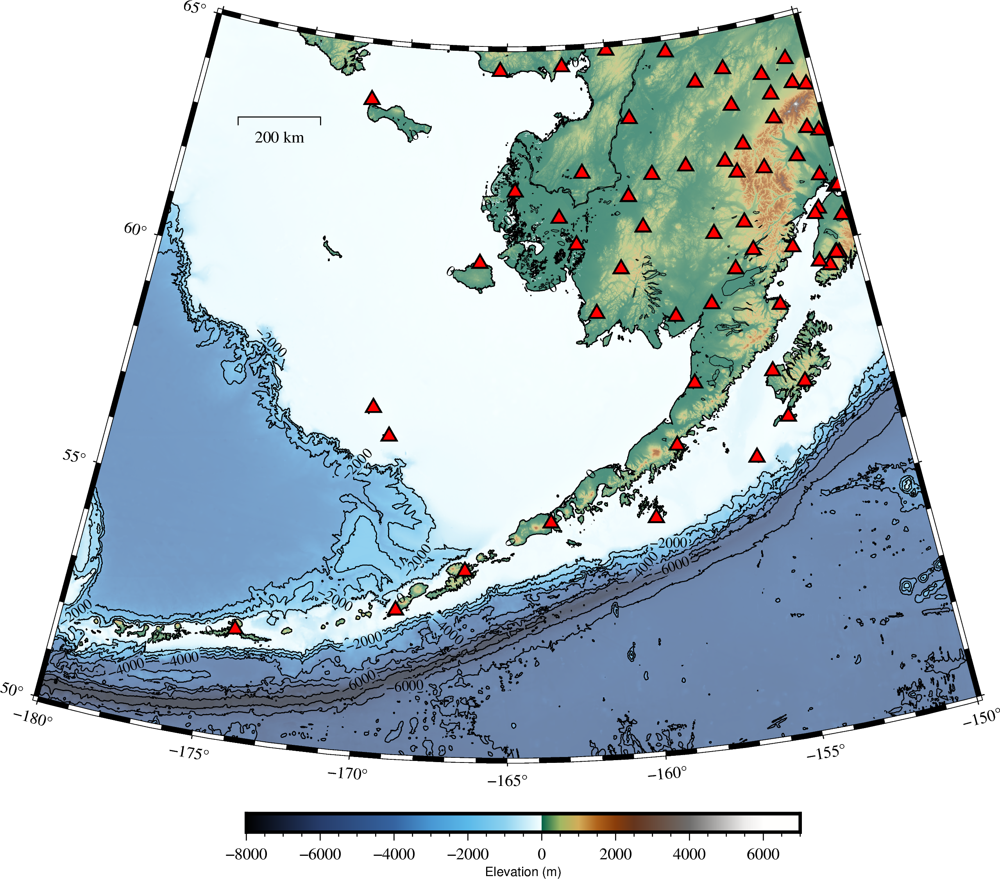

In [14]:
fig.plot(x=df['Longitude'],
         y=df['Latitude'],
         style='t0.15i', 
         color='red', 
         pen='1p,black')
fig.show()

### `Figure.text()`

[`Figure.text()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.text.html) Plot or typeset text strings of variable size, font type, and orientation.

> **Must provide at least one of the following combinations as input:
> * textfiles
> * x/y, and text
> * position and text 


* **font**: size,font,color e.g. `font="12p,Helvetica-Bold,red"`
* **justify**: Sets reference point on the map for the text 
* **fill**: filling the text box [Default is no fill].
* **pen**: draw a rectangle around the text string

##### especially for **font name**:
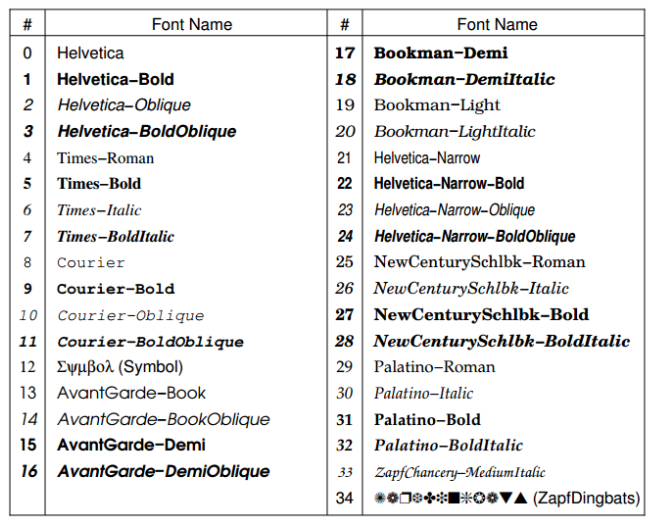

##### especially for **justify**:
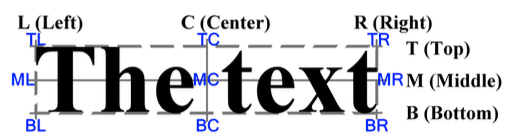

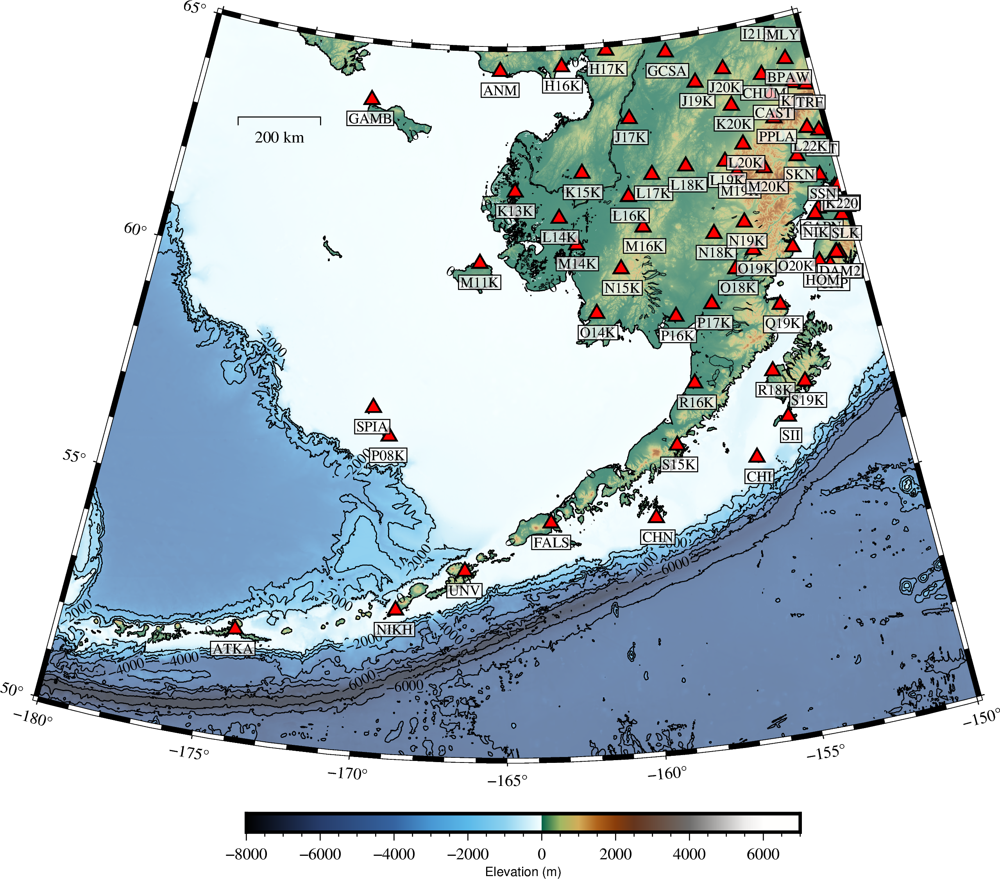

In [15]:
fig.text(x=df['Longitude'],
         y=df['Latitude']-0.3,
         text=df['Station'],
         font='9p,4,black',
         justify='TC',
         fill='white@30',  ## @ for transparency
         pen='0.5p,black')
fig.show()

In [16]:
fig.savefig('Alaska.png',dpi=200)
fig.savefig('Alaska.pdf')